In [ ]:
%load_ext autoreload
%autoreload 2
# %matplotlib

: 

In [3]:
from incense import ExperimentLoader
from utils import *
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import umap
from mechanics import *

In [4]:
loader = ExperimentLoader(
    mongo_uri='mongodb://localhost:27017',
    db_name='metatop'
)
filter_tags = ['bad']
experiments = load_experiments(loader, 'extremal', filter_tags)

In [5]:
experiment = experiments[-2]

In [6]:
def flatten_C(C):
    return np.array([C[0, 0],
                     C[1, 1],
                     C[2, 2],
                     C[1, 2],
                     C[0, 2],
                     C[0, 1]])
    
def build_df(experiments):
    records = []
    
    for e in experiments:
        _, Es, Gs, nus = generate_planar_values(e.info.final_C, input_style='standard')
        flat_C = flatten_C(e.info.final_C)
        records.append({
            'id': e.id,
            'C11': flat_C[0],
            'C22': flat_C[1],
            'C33': flat_C[2],
            'C23': flat_C[3],
            'C13': flat_C[4],
            'C12': flat_C[5],
            'extremal_mode': e.config.get('extremal_mode', -1),
            'basis_v': e.config.get('basis_v', 'None'),
            'w1': e.info.eigvals[0],
            'w2': e.info.eigvals[1],
            'w3': e.info.eigvals[2],
            'nu_max': np.max(nus),
            'nu_min': np.min(nus),
            'E_max': np.max(Es),
            'E_min': np.min(Es),
            'G_max': np.max(Gs),
            'G_min': np.min(Gs),
            'Es': Es,
            'Gs': Gs,
            'nus': nus,
        })
        
    df = pd.DataFrame.from_records(records)
    C = flatten_C(isotropic_elasticity_matrix(E=1, nu=0.45, output_style='standard'))
    df.loc[len(df)] = {'id': -1,
                       'C11': C[0],
                       'C22': C[1],
                       'C33': C[2],
                       'C23': C[3],
                       'C13': C[4],
                       'C12': C[5],
                       'extremal_mode': 0,
                       'basis_v': 'BULK',
                       'w1': np.nan,
                       'w2': np.nan,
                       'w3': np.nan,
                       'nu_max': 0.45,
                       'nu_min': 0.45,
                       'E_max': 1.,
                       'E_min': 1.,
                       'G_max': 100.,
                       'G_min': 100.,
                       'Es': 1.,
                       'Gs': 100.,
                       'nus': 0.45,
    }
                       
    df['marker'] = df.apply(lambda row: f"{row['basis_v']}_{row['extremal_mode']}", axis=1)
    
    df.sort_values(by='extremal_mode', ascending=True, inplace=True)
    
    return df
    

In [7]:
df = build_df(experiments)
df.head()

,id,C11,C22,C33,C23,C13,C12,extremal_mode,basis_v,w1,...,nu_max,nu_min,E_max,E_min,G_max,G_min,Es,Gs,nus,marker
137,-1,1.253918,1.253918,0.344828,0.000000,0.000000,0.564263,0,BULK,NaN,...,0.450000,0.450000,1.000000,1.000000,100.000000,100.000000,1.0,100.0,0.45,BULK_0
77,599,0.441195,0.181036,0.263004,0.000131,-0.000541,0.000637,1,VERT,0.181034,...,0.003519,-0.366052,0.448540,0.181035,0.263003,0.128101,"[0.4411918204610157, 0.4411861519031214, 0.441...","[0.26300299029250956, 0.26297217978771625, 0.2...","[0.0035187660305875785, 0.0034695859062821243,...",VERT_1
76,598,0.255264,0.257443,0.049065,0.000020,0.000042,0.004295,1,SHEAR,0.049065,...,0.453124,0.016683,0.257371,0.142531,0.126027,0.049065,"[0.25519263788218377, 0.2551634804135776, 0.25...","[0.04906548969633951, 0.04907010950691384, 0.0...","[0.016683022990902945, 0.016803519129998744, 0...",SHEAR_1
75,596,0.079268,0.078891,0.154250,-0.003063,-0.002201,0.014998,1,BULK,0.064076,...,0.189708,-0.546922,0.147916,0.075997,0.154097,0.032039,"[0.07640017386222737, 0.07639577257392238, 0.0...","[0.15409695310704646, 0.15395167478248384, 0.1...","[0.1897008111851134, 0.18957292436065606, 0.18...",BULK_1
73,594,0.230623,0.116019,0.115323,-0.063874,-0.001884,0.002892,1,HSA,0.051793,...,0.310565,-0.451841,0.264717,0.067087,0.133317,0.045633,"[0.23055015769095547, 0.23053186161741077, 0.2...","[0.0801566169771205, 0.07906090101080344, 0.07...","[0.022920723702423106, 0.012954122404806487, 0...",HSA_1


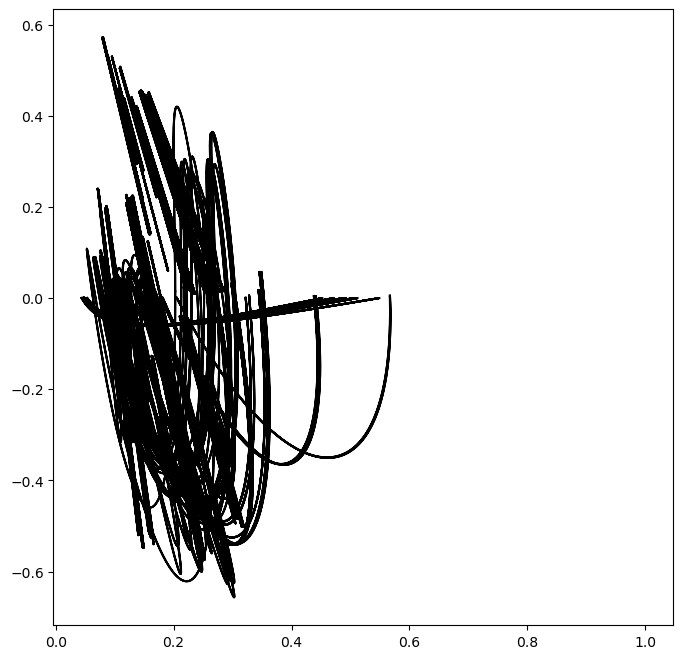

In [8]:
fig, ax = plt.subplots(figsize=(8,8))

marker_cats = df['marker'].unique()

for m in marker_cats:
    df_subset = df[df['marker'] == m]
    # print(df_subset)
    for _, s in df_subset.iterrows():
        # print(s['Es'])
        ax.plot(s['Es'], s['nus'], color='k')
        # break
    # break

# ax.set(aspect='equal')
# ax.grid(True)

In [19]:
fig = px.scatter()

marker_cats = df['marker'].unique()

for m in marker_cats:
    df_subset = df[df['marker'] == m]
    fig.add_scatter(x=df_subset['Es'], y=df_subset['nus'], mode='lines', name=f'Marker {m}' )
    
fig.show()

In [20]:
df.head()

,id,C11,C22,C33,C23,C13,C12,extremal_mode,basis_v,w1,...,nu_max,nu_min,E_max,E_min,G_max,G_min,Es,Gs,nus,marker
137,-1,1.253918,1.253918,0.344828,0.000000,0.000000,0.564263,0,BULK,NaN,...,0.450000,0.450000,1.000000,1.000000,100.000000,100.000000,1.0,100.0,0.45,BULK_0
77,599,0.441195,0.181036,0.263004,0.000131,-0.000541,0.000637,1,VERT,0.181034,...,0.003519,-0.366052,0.448540,0.181035,0.263003,0.128101,"[0.4411918204610157, 0.4411861519031214, 0.441...","[0.26300299029250956, 0.26297217978771625, 0.2...","[0.0035187660305875785, 0.0034695859062821243,...",VERT_1
76,598,0.255264,0.257443,0.049065,0.000020,0.000042,0.004295,1,SHEAR,0.049065,...,0.453124,0.016683,0.257371,0.142531,0.126027,0.049065,"[0.25519263788218377, 0.2551634804135776, 0.25...","[0.04906548969633951, 0.04907010950691384, 0.0...","[0.016683022990902945, 0.016803519129998744, 0...",SHEAR_1
75,596,0.079268,0.078891,0.154250,-0.003063,-0.002201,0.014998,1,BULK,0.064076,...,0.189708,-0.546922,0.147916,0.075997,0.154097,0.032039,"[0.07640017386222737, 0.07639577257392238, 0.0...","[0.15409695310704646, 0.15395167478248384, 0.1...","[0.1897008111851134, 0.18957292436065606, 0.18...",BULK_1
73,594,0.230623,0.116019,0.115323,-0.063874,-0.001884,0.002892,1,HSA,0.051793,...,0.310565,-0.451841,0.264717,0.067087,0.133317,0.045633,"[0.23055015769095547, 0.23053186161741077, 0.2...","[0.0801566169771205, 0.07906090101080344, 0.07...","[0.022920723702423106, 0.012954122404806487, 0...",HSA_1


In [23]:
fig = px.scatter(df, 
                 x='nu_min', 
                 y='nu_max',
                 symbol='marker',
                 color='marker',
                 width=800,
                 height=800,
                 hover_data={'id': True}
                 )
fig.update_traces(marker=dict(size=15))
fig.update_layout(xaxis=dict(scaleanchor='y'))

fig.show()

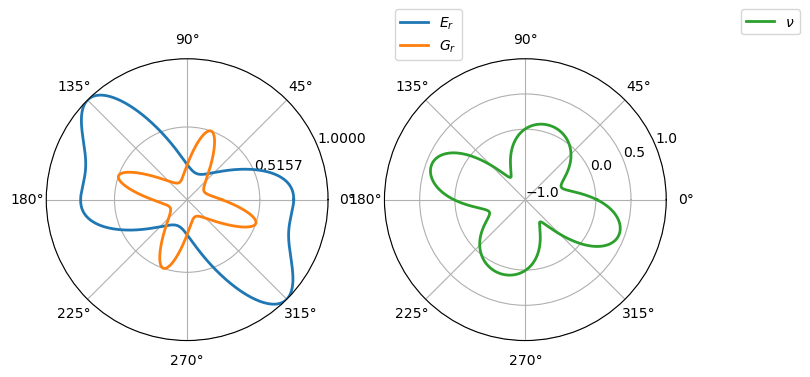

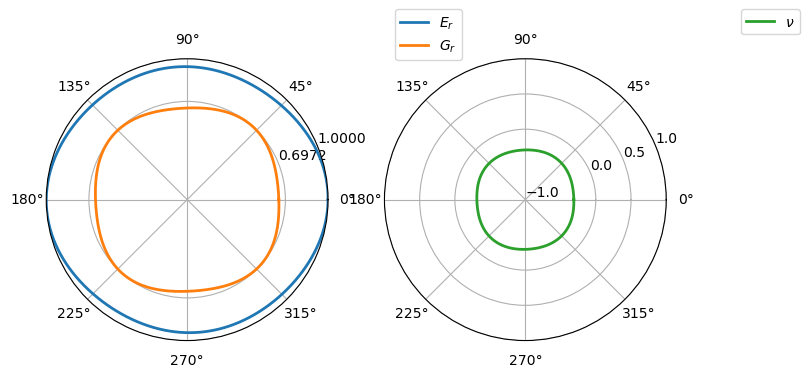

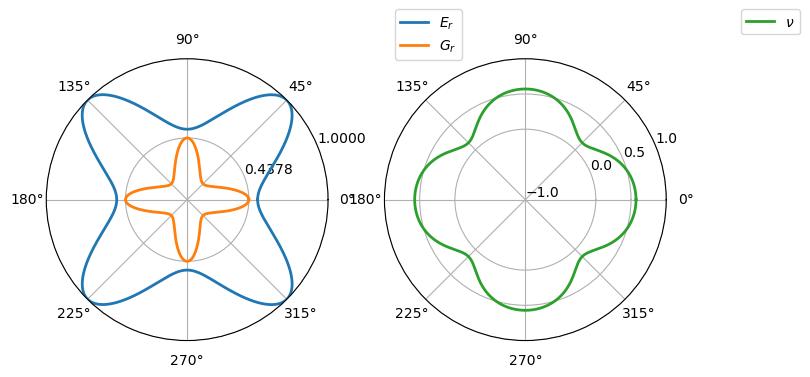

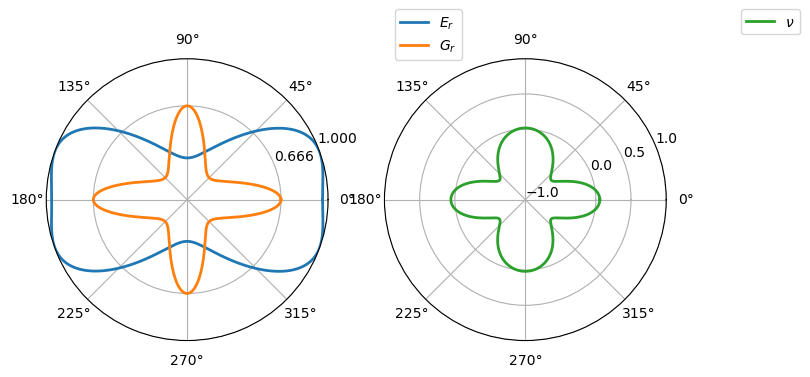

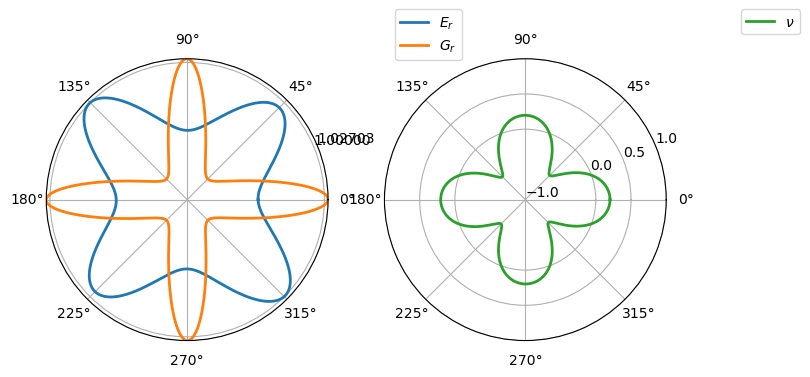

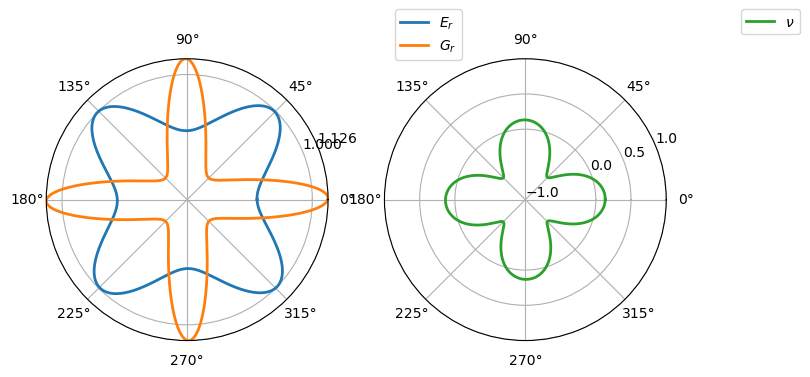

In [27]:
def get_2d_C(s):
    return np.array([[s['C11'], s['C12'], s['C13']],
                     [s['C12'], s['C22'], s['C23']],
                     [s['C13'], s['C23'], s['C33']]])
    
idxs = (509, 510, 539, 553, 535, 529)
for idx in idxs:
    polar_plot(get_2d_C(df[df['id'] == idx]), input_style='standard', size=(8, 8))


In [11]:
cols = ['C11', 'C22', 'C33', 'C23', 'C13', 'C12']
data_subset = df[cols]

scaler = StandardScaler()
data_scaled = scaler.fit_transform(data_subset)

n_components = 3
pca = PCA(n_components=n_components)
pca_result = pca.fit_transform(data_scaled)
pca_df = pd.DataFrame(pca_result, columns=[f'PC{i}' for i in range(1, n_components+1)])

tsne = TSNE(n_components=n_components, random_state=42)
tsne_result = tsne.fit_transform(data_scaled)
tsne_df = pd.DataFrame(tsne_result, columns=[f'tSNE{i}' for i in range(1, n_components+1)])

umap = umap.UMAP(n_components=n_components, random_state=42)
umap_result = umap.fit_transform(data_scaled)
umap_df = pd.DataFrame(umap_result, columns=[f'UMAP{i}' for i in range(1, n_components+1)])

aug_df = pd.concat([df, pca_df, tsne_df, umap_df], axis=1)

In [12]:
aug_df.head()

,id,C11,C22,C33,C23,C13,C12,extremal_mode,basis_v,w1,...,marker,PC1,PC2,PC3,tSNE1,tSNE2,tSNE3,UMAP1,UMAP2,UMAP3
137,-1,1.253918,1.253918,0.344828,0.000000,0.000000,0.564263,0,BULK,NaN,...,BULK_0,0.153283,0.123550,0.269694,-66.496254,-1.029169,-47.488884,11.909936,-1.821213,4.962783
77,599,0.441195,0.181036,0.263004,0.000131,-0.000541,0.000637,1,VERT,0.181034,...,VERT_1,0.010854,-0.610824,-0.013192,-31.293917,1.133247,-7.284026,12.137155,-2.480830,5.273192
76,598,0.255264,0.257443,0.049065,0.000020,0.000042,0.004295,1,SHEAR,0.049065,...,SHEAR_1,-0.624352,-0.122974,2.464246,22.299854,54.661564,70.918198,-0.558802,2.561976,2.741260
75,596,0.079268,0.078891,0.154250,-0.003063,-0.002201,0.014998,1,BULK,0.064076,...,BULK_1,-0.829404,-0.158231,1.668712,5.013042,34.187740,77.192039,-0.376055,2.066828,2.515563
73,594,0.230623,0.116019,0.115323,-0.063874,-0.001884,0.002892,1,HSA,0.051793,...,HSA_1,-0.779748,-0.232300,1.953059,30.884295,43.042442,49.228985,-0.381117,2.130207,2.716970


In [13]:
# Assuming df is your DataFrame and the PCA results are ready
# 1. First scatter plot (PC1 vs PC2)
scatter_fig = px.scatter(aug_df, x='PC1', y='PC2', color='basis_v', symbol='extremal_mode')

# 2. Cumulative explained variance plot
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

variance_df = pd.DataFrame({
    'Number of PCs': range(1, n_components + 1),
    'Cumulative Explained Variance': cumulative_variance,
})

cumulative_variance_fig = px.line(variance_df, x='Number of PCs', y='Cumulative Explained Variance',
                                  title='Cumulative Explained Variance by PC', markers=True)

# 3. Scree plot
scree_df = pd.DataFrame({
    'Principal Component': range(1, len(explained_variance_ratio) + 1),
    'Explained Variance Ratio': explained_variance_ratio,
})

scree_fig = px.line(scree_df, x='Principal Component', y='Explained Variance Ratio', 
                    title='Scree Plot', markers=True)

# Combine the plots into a subplot figure
fig = make_subplots(rows=1, cols=3, subplot_titles=("PC1 vs PC2", "Cumulative Explained Variance", "Scree Plot"))

# Add the scatter plot
for trace in scatter_fig.data:
    fig.add_trace(trace, row=1, col=1)

# Add cumulative explained variance plot
for trace in cumulative_variance_fig.data:
    fig.add_trace(trace, row=1, col=2)

# Add scree plot
for trace in scree_fig.data:
    fig.add_trace(trace, row=1, col=3)

# Update layout for better spacing and titles
fig.update_layout(height=1000, width=2000, showlegend=False)

# Show the combined figure
fig.show()


In [14]:
fig = go.Figure()

# Main 3D scatter plot
fig.add_trace(go.Scatter3d(
    x=aug_df['PC1'],
    y=aug_df['PC2'],
    z=aug_df['PC3'],
    mode='markers',
    marker=dict(size=5, ),
    name='Data Points'
))

fig.update_layout(
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3',
        xaxis=dict(showgrid=True),
        yaxis=dict(showgrid=True),
        zaxis=dict(showgrid=True),
    ),
    title=f'PC 3D Scatter Plot)',
    width=800,
    height=800,
)

In [15]:
perplexities = [5, 30, 50]
for perplexity in perplexities:
    tsne = TSNE(n_components=n_components, perplexity=perplexity, random_state=42)
    tsne_result = tsne.fit_transform(data_scaled)  # Use scaled data
    tsne_df = pd.DataFrame(tsne_result, columns=[f'TSNE{i}' for i in range(1, n_components+1)])
    tsne_df = pd.concat([df, tsne_df], axis=1)
    
    fig = px.scatter(tsne_df, x='TSNE1', y='TSNE2', color='basis_v', symbol='extremal_mode', title=f't-SNE (perplexity={perplexity})')
    fig.show()


In [16]:
for perplexity in perplexities:
    # Perform t-SNE with 3 components
    tsne = TSNE(n_components=3, perplexity=perplexity, random_state=42)
    tsne_result = tsne.fit_transform(data_scaled)  # Use scaled data
    tsne_df = pd.DataFrame(tsne_result, columns=['TSNE1', 'TSNE2', 'TSNE3'])
    tsne_df = pd.concat([df, tsne_df], axis=1)
    
    # Define a 3D scatter plot
    fig = go.Figure()

    # Main 3D scatter plot
    fig.add_trace(go.Scatter3d(
        x=tsne_df['TSNE1'],
        y=tsne_df['TSNE2'],
        z=tsne_df['TSNE3'],
        mode='markers',
        marker=dict(size=5, ),
        name='Data Points'
    ))

    # # XY-plane projection (z=0)
    # fig.add_trace(go.Scatter(
    #     x=tsne_df['TSNE1'],
    #     y=tsne_df['TSNE2'],
    #     mode='markers',
    #     marker=dict(size=2, color='rgba(150,150,150,0.5)'),  # Light gray for shadow
    #     name='XY Projection'
    # ))

    # # XZ-plane projection (y=0)
    # fig.add_trace(go.Scatter(
    #     x=tsne_df['TSNE1'],
    #     y=tsne_df['TSNE3'],
    #     mode='markers',
    #     marker=dict(size=2, color='rgba(150,150,150,0.5)'),  # Light gray for shadow
    #     name='XZ Projection'
    # ))

    # # YZ-plane projection (x=0)
    # fig.add_trace(go.Scatter(
    #     x=tsne_df['TSNE2'],
    #     y=tsne_df['TSNE3'],
    #     mode='markers',
    #     marker=dict(size=2, color='rgba(150,150,150,0.5)'),  # Light gray for shadow
    #     name='YZ Projection'
    # ))

    # # Set 3D layout
    fig.update_layout(
        scene=dict(
            xaxis_title='TSNE1',
            yaxis_title='TSNE2',
            zaxis_title='TSNE3',
            xaxis=dict(showgrid=True),
            yaxis=dict(showgrid=True),
            zaxis=dict(showgrid=True),
        ),
        title=f't-SNE 3D Scatter with Shadows (perplexity={perplexity})',
        width=800,
        height=800,
    )

    # Show the plot
    fig.show()

In [17]:
# Plot the UMAP result, coloring by 'basis_v' (replace with your label)
fig = px.scatter(aug_df, x='UMAP1', y='UMAP2', color='basis_v', 
                 symbol='extremal_mode', title='UMAP Visualization')
fig.show()
